<a href="https://colab.research.google.com/github/dmitrienkoae/Sirius_2021/blob/main/CLIP_sirius.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Запуск IIN с гитхаба**

Клонируем гит:

In [ ]:
import os
! git clone https://github.com/CompVis/iin.git
os.chdir("/content/iin")
! pip install -e .

fatal: destination path 'iin' already exists and is not an empty directory.
Obtaining file:///content/iin
  Attempting uninstall: iin
    Found existing installation: iin 0.1
    Can't uninstall 'iin'. No files were found to uninstall.
  Running setup.py develop for iin


Устанавливаем нужные версии библиотек:

In [ ]:
! pip install edflow
! pip install torchvision==0.5
! pip install numpy==1.17
! pip install -U PyYAML
! pip install git+https://github.com/pesser/edflow.git@711a728c7afc50a88017bc37213fbe485fc13efe#egg=edflow[full]
! pip install -e git+https://github.com/jhaux/PerceptualSimilarity.git@f752859b104702e52abbe49750c595b4fb980382#egg=perceptual_similarity
! pip install -e git+https://github.com/rromb/fid.git@e6deef55cdb56944a540c3d74739438111292ec8#egg=fid-callback
! pip install albumentations==0.4.3
! pip install opencv-python==4.1.2.30
! pip install pudb==2019.2

In [ ]:
!pip install wandb

Чтобы запустить обучение модели:

In [ ]:
#! edflow -b configs/cifar_ae.yaml -t
#!edflow -b configs/cmnist_iin.yaml configs/project.yaml -t
!edflow -b configs/cifar_ae.yaml configs/project.yaml -t

/usr/local/lib/python3.7/dist-packages/chainer/_environment_check.py:75: UserWarning: 
--------------------------------------------------------------------------------
CuPy (cupy-cuda101) version 9.1.0 may not be compatible with this version of Chainer.
Please consider installing the supported version by running:
  $ pip install 'cupy-cuda101>=7.7.0,<8.0.0'

See the following page for more details:
  https://docs.cupy.dev/en/latest/install.html
--------------------------------------------------------------------------------

  requirement=requirement, help=help))
[INFO] [run]: /usr/local/bin/edflow -b configs/cifar_ae.yaml configs/project.yaml -t
[INFO] [run]: root: logs/2021-08-05T21-32-03_cifar_ae
[INFO] [run]: hostname: 44c2cde3d025
error connecting to /tmp/tmux-0/default (No such file or directory)
[INFO] [run]: tmux: 
[INFO] [run]: pid: 1321
[INFO] [run]: pgid: 1124
[INFO] [run]: Project structure:
logs/2021-08-05T21-32-03_cifar_ae
├╴code
├╴train
  ├╴checkpoints
├╴eval
├╴configs



In [ ]:
!pip install pillow==3.0

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!tar xzf '/content/drive/MyDrive/logs.tar.gz'  -C '/content/iin'

In [ ]:
!ls '/content/iin/logs/2020-04-24T09-47-43_cifar_ae/train/checkpoints'

model-534000.ckpt


In [ ]:
import torch
import yaml

In [ ]:
!pip install -U PyYAML

In [ ]:
with open('/content/iin/configs/fashionmnist_iin.yaml') as f:
    config_iin = yaml.load(f, Loader=yaml.FullLoader)
with open('/content/iin/configs/fashionmnist_ae.yaml') as f:
    config_ae = yaml.load(f, Loader=yaml.FullLoader)

In [ ]:
with open('/content/iin/configs/celeba_diin.yaml') as f:
    config_iin = yaml.load(f, Loader=yaml.FullLoader)
with open('/content/iin/configs/celeba_ae.yaml') as f:
    config_ae = yaml.load(f, Loader=yaml.FullLoader)

In [ ]:
!ls /content/iin/logs/2020-04-25T12-24-20_celeba_iin/train/checkpoints

model-84643.ckpt


In [ ]:
PATH_ae = '/content/iin/logs/2020-04-24T09-47-43_cifar_ae/train/checkpoints/model-534000.ckpt'
PATH_iin = '/content/iin/iin/logs/2020-04-26T23-13-03_cifar_iin/train/checkpoints/model-32000.ckpt'

PATH_ae = '/content/iin/logs/2020-04-23T00-17-38_fashionmnist_ae/train/checkpoints/model-120000.ckpt'
PATH_iin = '/content/iin/logs/2020-04-23T10-31-16_fashionmnist_iin/train/checkpoints/model-110400.ckpt'

PATH_ae = '/content/iin/logs/2020-04-23T23-43-25_celeba_ae/train/checkpoints/model-572968.ckpt'
PATH_iin = '/content/iin/logs/2020-04-28T09-50-03_celeba_diin/train/checkpoints/model-32555.ckpt'

In [ ]:
from iin.models.iin import  VectorTransformer
from iin.models.iin import FactorTransformer
from iin.models.iin import EfficientVRNVP
from iin.models.ae import Model
%load_ext autoreload 
%autoreload 1

/usr/local/lib/python3.7/dist-packages/chainer/_environment_check.py:75: UserWarning: 
--------------------------------------------------------------------------------
CuPy (cupy-cuda101) version 9.1.0 may not be compatible with this version of Chainer.
Please consider installing the supported version by running:
  $ pip install 'cupy-cuda101>=7.7.0,<8.0.0'

See the following page for more details:
  https://docs.cupy.dev/en/latest/install.html
--------------------------------------------------------------------------------

  requirement=requirement, help=help))


In [ ]:
model = Model(config_ae)
model.load_state_dict(torch.load(PATH_ae, map_location=torch.device('cpu'))['model'])

#vt = VectorTransformer(config_iin)
#vt.load_state_dict(torch.load(PATH_iin, map_location=torch.device('cpu'))['model'])
ft = FactorTransformer(config_iin)
ft.load_state_dict(torch.load(PATH_iin, map_location=torch.device('cpu'))['model'])

<All keys matched successfully>

In [ ]:
import iin.data as d
#data = d.CIFAR10Train(config_ae)
#data = d.FashionMNISTTrain(config_ae)

In [ ]:
!rm -rf /root/.eddata_cache/

In [ ]:
!mkdir '/root/.eddata_cache/'

In [ ]:
!mkdir '/root/.eddata_cache/CelebA'

In [ ]:
!cp '/content/drive/MyDrive/.eddata_cache/CelebA/img_align_celeba.zip' '/root/.eddata_cache/CelebA'

In [ ]:
!ls '/root/.eddata_cache/CelebA/'

img_align_celeba.zip


In [ ]:
!cp '/content/drive/MyDrive/.eddata_cache/CelebA/identity_CelebA.txt' '/root/.eddata_cache/CelebA'

In [ ]:
!cp '/content/drive/MyDrive/.eddata_cache/CelebA/list_attr_celeba.txt' '/root/.eddata_cache/CelebA'

In [ ]:
!cp '/content/drive/MyDrive/.eddata_cache/CelebA/list_eval_partition.txt' '/root/.eddata_cache/CelebA'

In [ ]:
import iin.data as d

celeba = d.CelebATrain(config_iin)

INFO:CelebATrain:Using split: train


In [ ]:
data=celeba

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
batch = [data.get_example(i)['image'] for i in range(260, 324)]
batch = torch.Tensor(batch)

In [ ]:
encode = model.encode(batch.permute(0,3,1,2))
embd = encode.mean
decode = model.decode(embd)

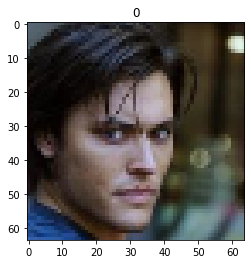

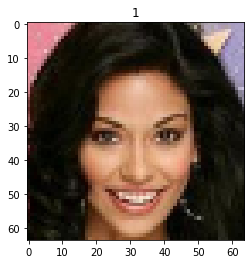

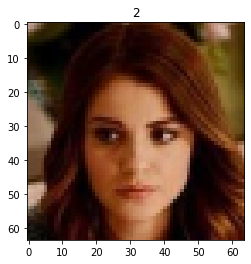

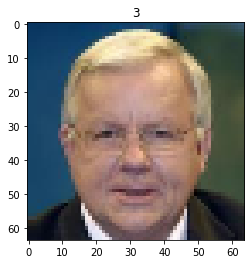

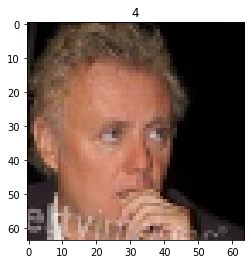

...

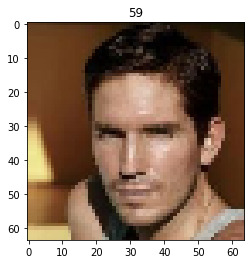

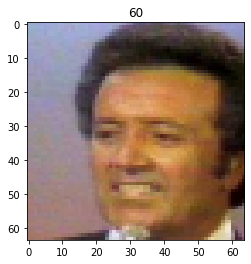

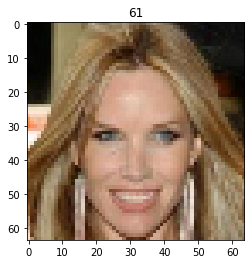

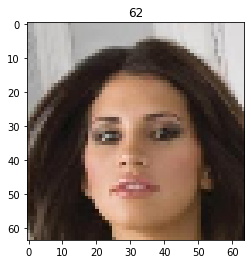

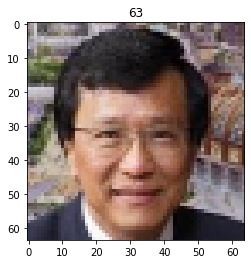

In [ ]:
for i in range(64):
  plt.imshow((batch[i]+1)/2)
  plt.title(str(i))
  plt.show()

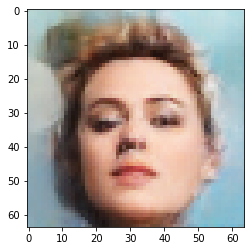

In [ ]:
plt.imshow((decode.permute(0, 2, 3, 1)[4].detach().numpy()+1)/2)

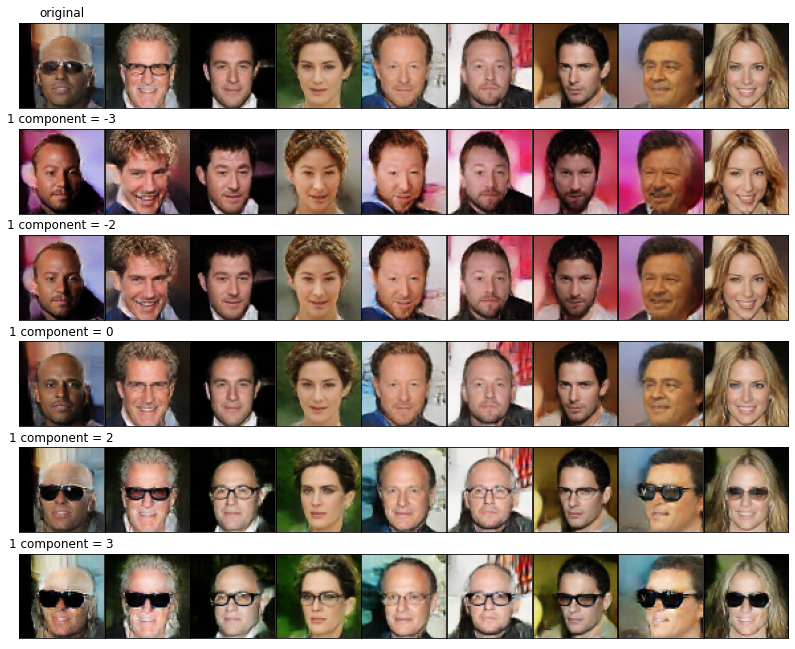

In [ ]:
import matplotlib.pyplot as plt
#samples = [10, 69, 70, 87, 100, 121, 106, 56, 66, 77]

batch = [data[i]['image'] for i in range(260, 324)]
mean = model.encode(torch.tensor(batch).permute(0, 3, 1, 2)).mean
forward = ft(mean)[0]

val_comp = [ -3, -2, 0, 2, 3]
samples = [5, 15, 36, 44, 46, 50, 59, 60, 61]
#samples = [19 ,8, 63,5,24,2,13,20,37,60,1]

fig, ax = plt.subplots(1+len(val_comp), len(samples),figsize=(12, 10), )
img_trans = model.decode(mean)
left  = 0.01  # the left side of the subplots of the figure
right = 0.9  # the right side of the subplots of the figure
bottom = 0.04   # the bottom of the subplots of the figure
top = 0.9   # the top of the subplots of the figure
wspace = 0.01   # the amount of width reserved for blank space between subplots
hspace = 0.2  # the amount of height reserved for white space between subplots
plt.subplots_adjust(left, bottom, right, top, wspace, hspace)

comp = 1
ax[0][0].set_title('original')

for i in range(len(samples)):
  ax[0][i].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[samples[i]]+ 1)/2)
  ax[0][i].grid(False)
  # Hide axes ticks
  ax[0][i].set_xticks([])
  ax[0][i].set_yticks([])
for k in  range(1, len(val_comp)+1):
  forward[0][:, comp] = val_comp[k-1]
  inv = ft.reverse(forward)
  img_trans = model.decode(inv)
  for i in range(len(samples)):
      ax[k][i].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[samples[i]]+ 1)/2)
      ax[k][i].grid(False)
      # Hide axes ticks
      ax[k][i].set_xticks([])
      ax[k][i].set_yticks([])
  i = 0
  ax[k][i].set_title(f'{comp} component = {val_comp[k-1]}')

In [ ]:
fig.savefig('/content/drive/MyDrive/iin_images/warm.png')

3 - старость

In [ ]:
import numpy as np
comp = 5
sample = 60
forward = ft(mean)[0]
forward[0][sample, comp] = 3
inv = ft.reverse(forward)
img_trans = model.decode(inv)
np.save(f'/content/drive/MyDrive/iin_images/{comp}_{sample}_negr.npy', img_trans.permute(0, 2, 3, 1).detach().numpy()[sample])

# forward = model_iin(mean)[0]
# # forward[0][1, 12] = -3
# inv = model_iin.reverse(forward)
img_trans = model.decode(mean)
np.save(f'/content/drive/MyDrive/iin_images/{comp}_{sample}_orig.npy', img_trans.permute(0, 2, 3, 1).detach().numpy()[sample])

Component 0


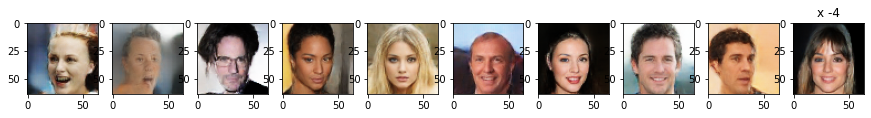

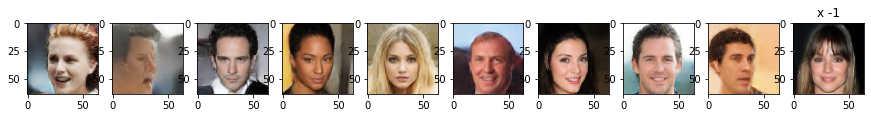

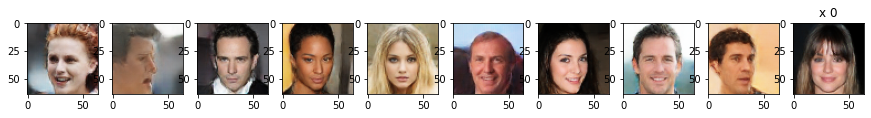

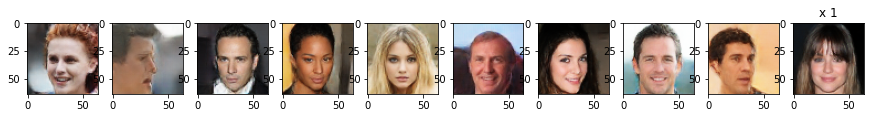

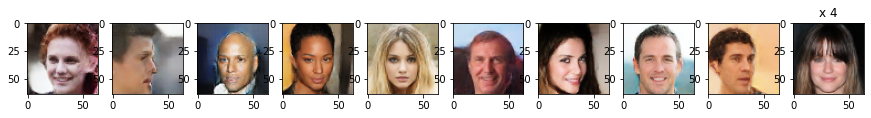

Component 1


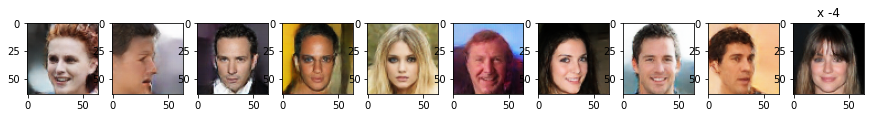

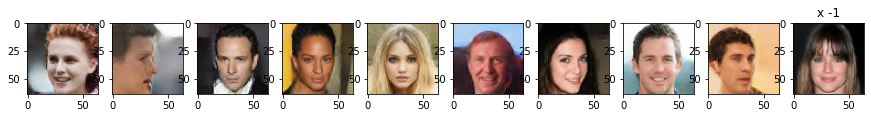

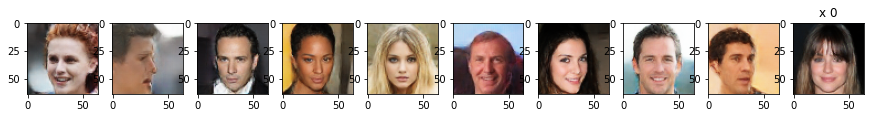

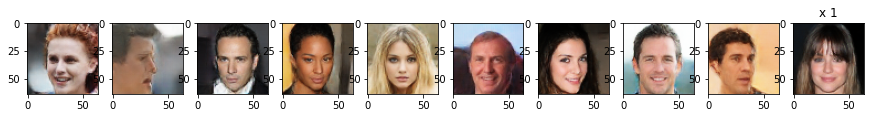

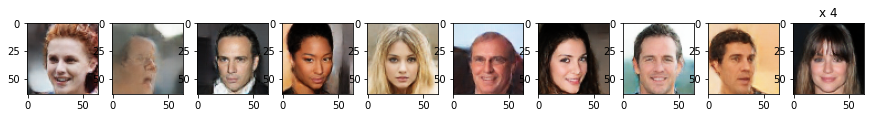

Component 2


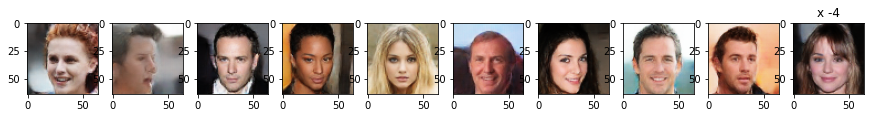

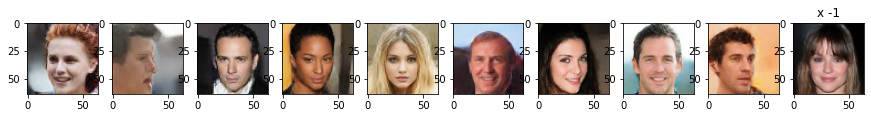

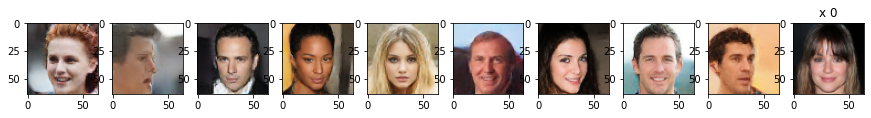

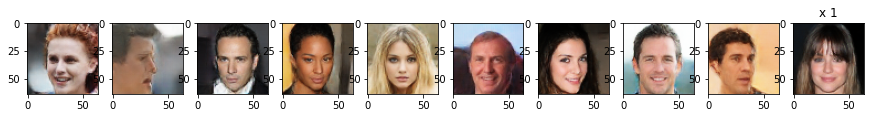

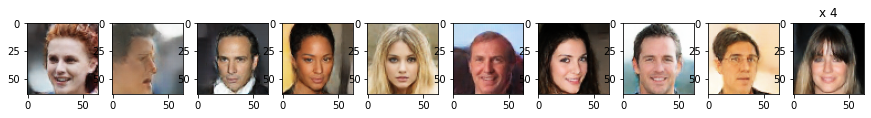

Component 3


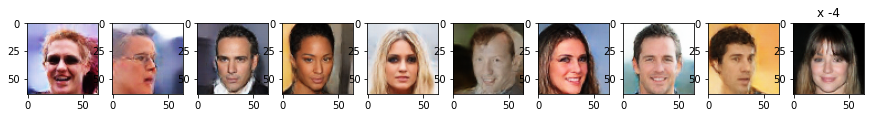

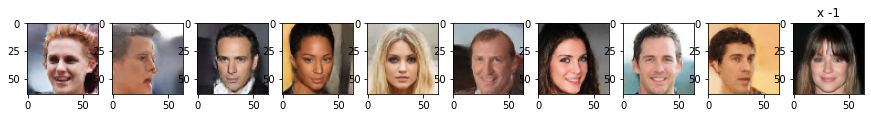

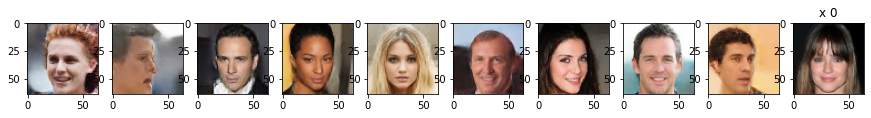

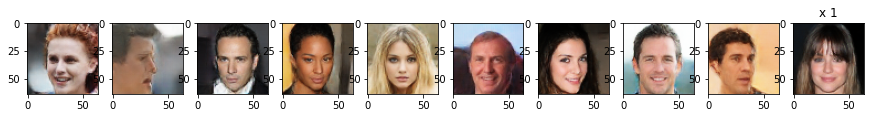

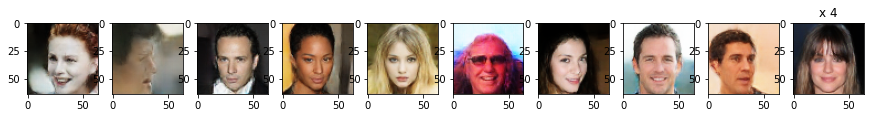

Component 4


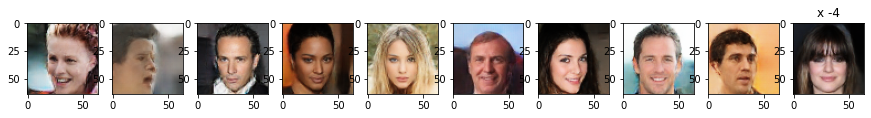

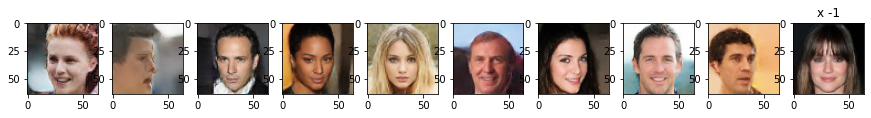

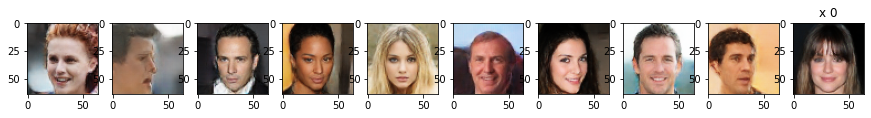

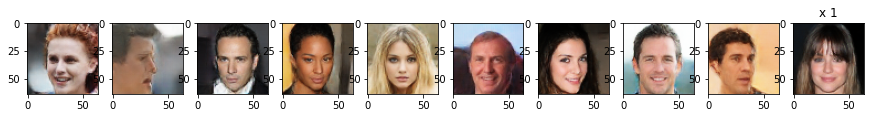

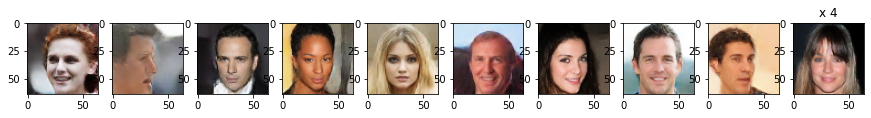

Component 5


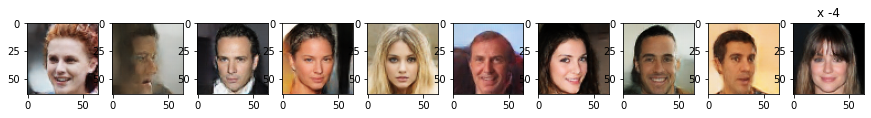

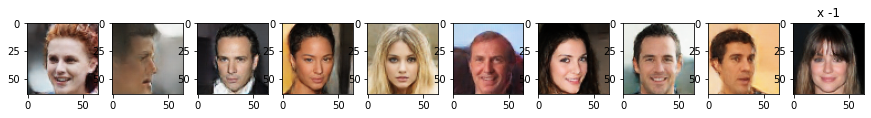

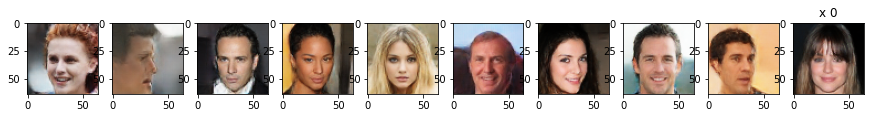

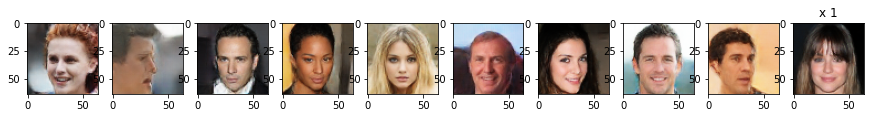

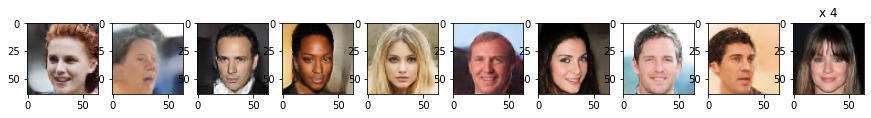

Component 6


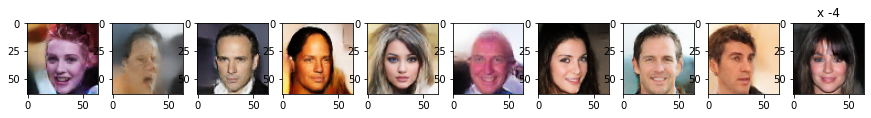

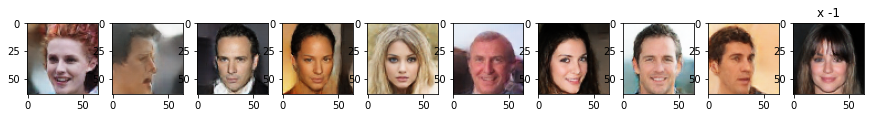

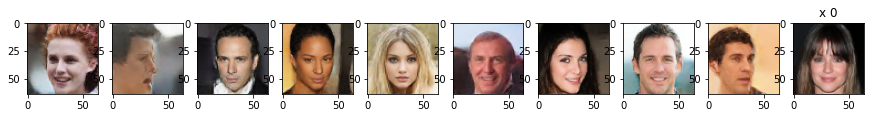

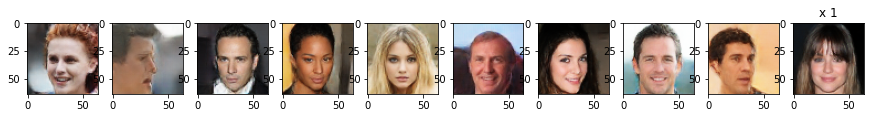

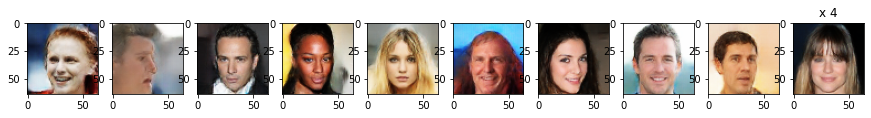

Component 7


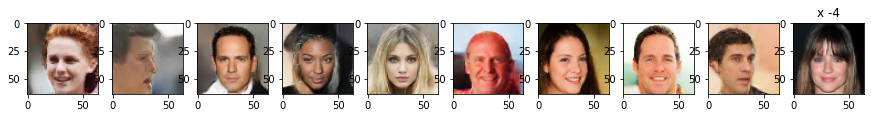

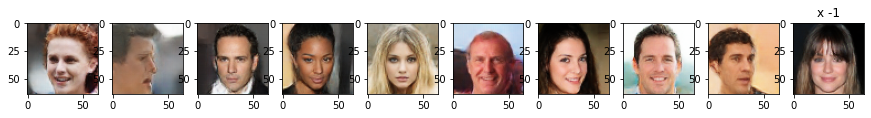

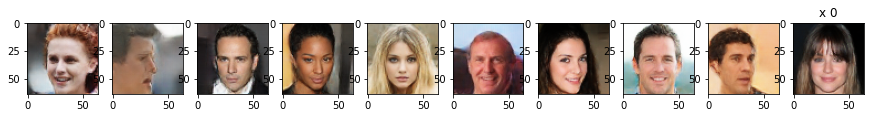

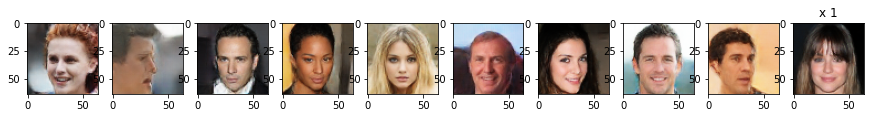

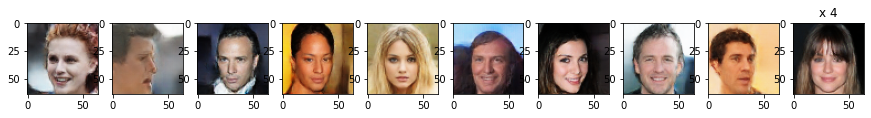

Component 8


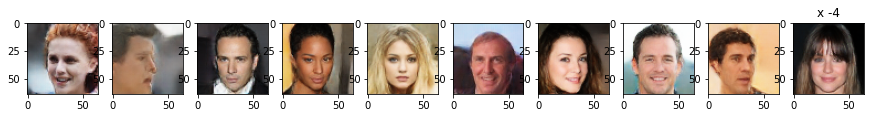

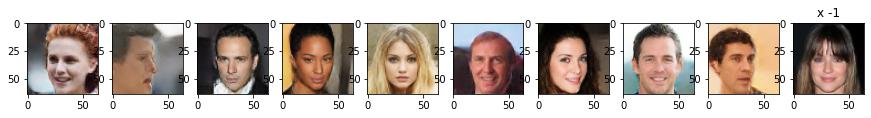

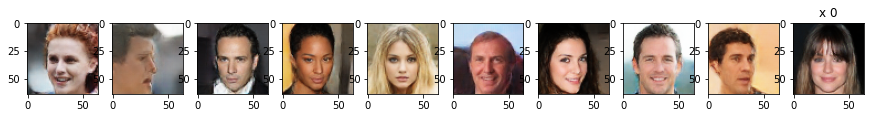

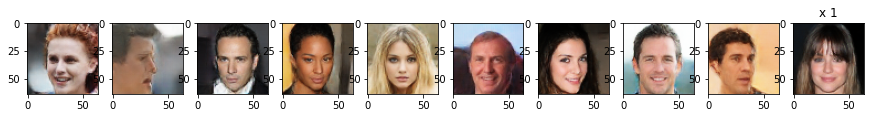

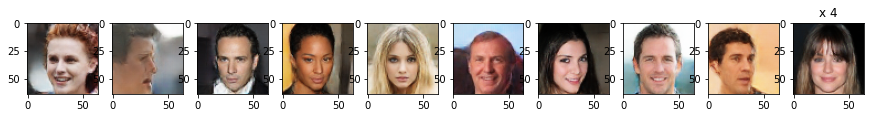

Component 9


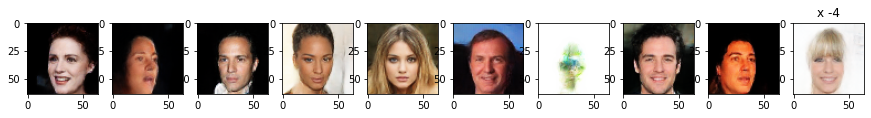

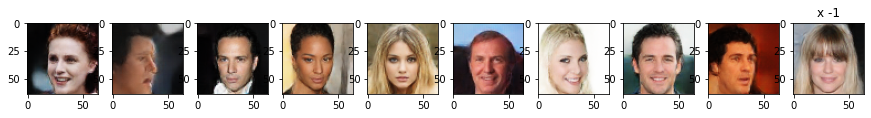

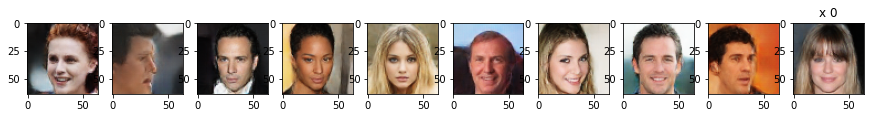

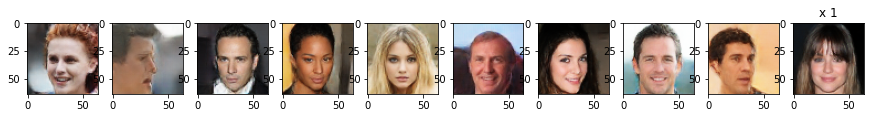

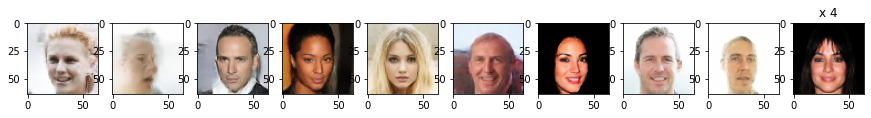

Component 10


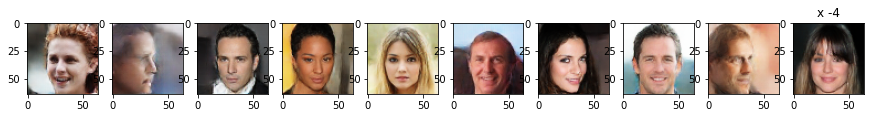

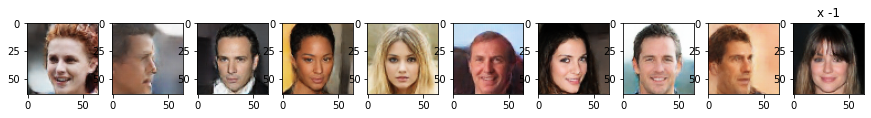

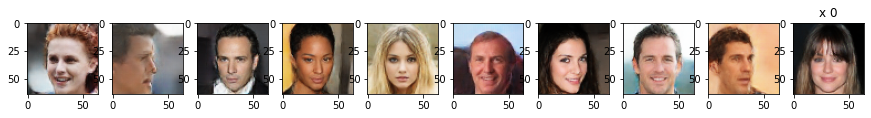

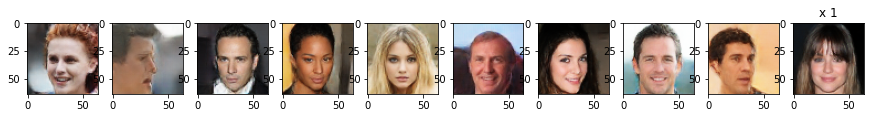

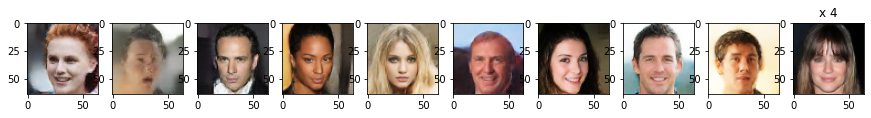

Component 11


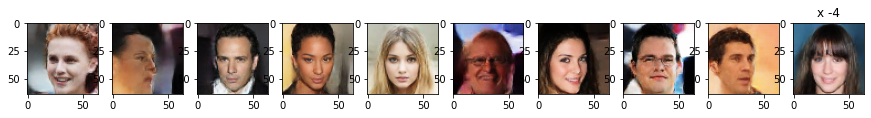

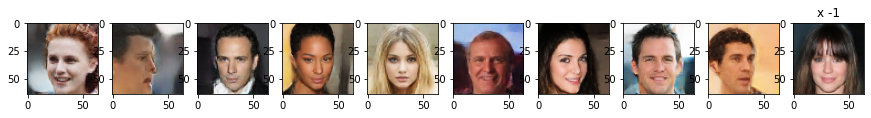

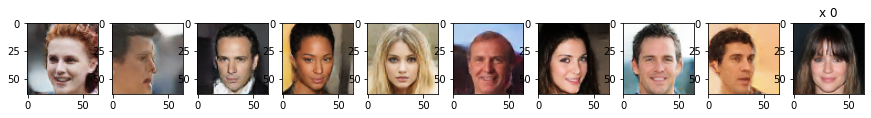

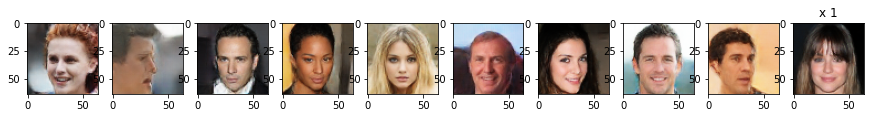

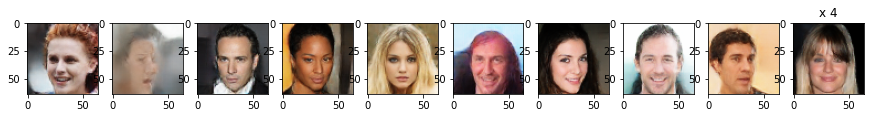

Component 12


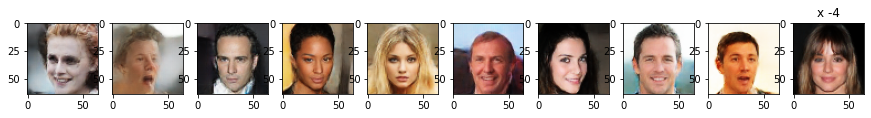

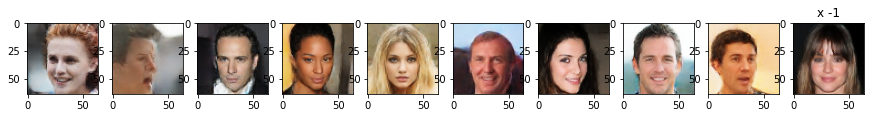

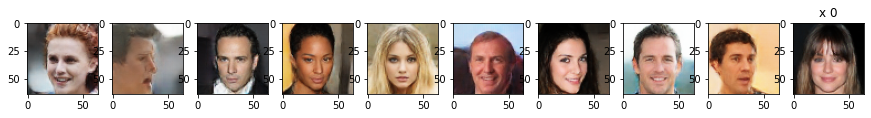

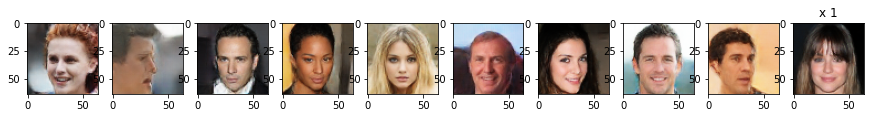

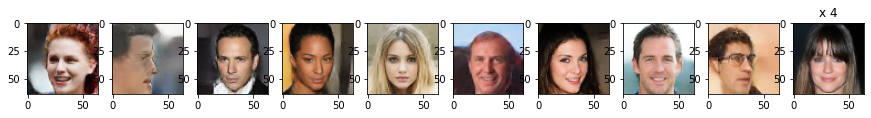

In [ ]:
for i in range(13):
  print(f'Component {i}')
  forward = ft(embd)[0]
  forward[0][:, i] = forward[0][:, i] * j
  inv = ft.reverse(forward)

  img_trans = model.decode(inv)
  fig, ax = plt.subplots(1, 10,figsize=(18, 18))

  ax[0].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[14]+ 1)/2)
  ax[1].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[16]+ 1)/2)
  ax[2].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[27]+ 1)/2)
  ax[3].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[54]+ 1)/2)
  ax[4].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[56]+ 1)/2)
  ax[5].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[60]+ 1)/2)
  ax[6].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[61]+ 1)/2)
  ax[7].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[37]+ 1)/2)
  ax[8].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[1]+ 1)/2)
  plt.title(f'x {j}')
  ax[9].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[5]+ 1)/2)
  for j in [-2.5, -2, -1.5, -1, 0, 1, 1.5, 2, 2.5]:
    forward = ft(embd)[0]
    forward[0][:, i] = forward[0][:, i] * j
    inv = ft.reverse(forward)

    img_trans = model.decode(inv)
    fig, ax = plt.subplots(1, 10,figsize=(18, 18))
    ax[0].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[14]+ 1)/2)
    ax[1].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[16]+ 1)/2)
    ax[2].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[27]+ 1)/2)
    ax[3].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[54]+ 1)/2)
    ax[4].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[56]+ 1)/2)
    ax[5].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[60]+ 1)/2)
    ax[6].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[61]+ 1)/2)
    ax[7].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[37]+ 1)/2)
    ax[8].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[1]+ 1)/2)
    plt.title(f'x {j}')
    ax[9].imshow((img_trans.permute(0, 2, 3, 1).detach().numpy()[5]+ 1)/2)
    
    plt.show()

0 - цвет кожи
2 - волосы
3 - краснота/синева


8 картинка 1 компонента умнжим на -4 -- очки

In [ ]:
import numpy as np
z_new = np.copy(z[].detach())
z_new[1][1] = z_new[1][1]*4
out2 = model.decode(vt.reverse(torch.Tensor(z_new)))
plt.imshow((out2.permute(0, 3, 2, 1)[1].detach().numpy()+1)/2)

TypeError: ignored

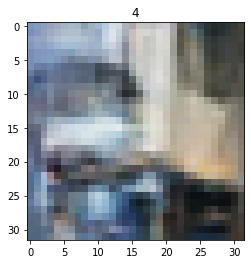

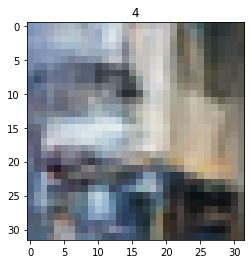

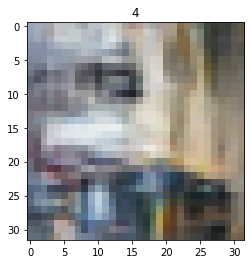

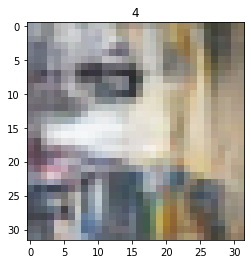

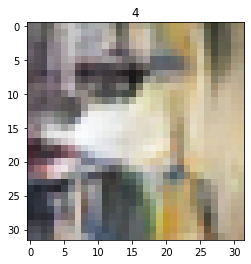

In [ ]:
for i in [4]:
  for n in [0.1, 0.8, 3, 6, 10]:
    forward = vt(embd)[0]
    forward[:, i] = forward[:, i] * n
    inv = vt.reverse(forward)

    img_trans = model.decode(inv)
    plt.imshow((img_trans.permute(0, 3, 2, 1).detach().numpy()[1]+ 1)/2)
    plt.title(str(i))
    plt.show()

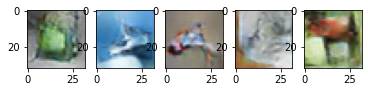

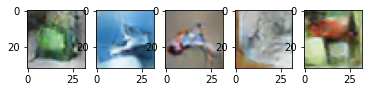

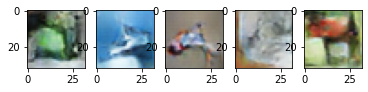

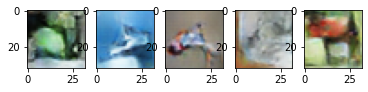

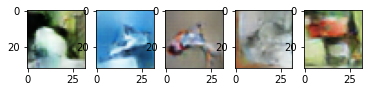

In [ ]:

for i in [7]:
  for j in [0.2, 1.2, 2.2, 3, 6]:
    forward = vt(embd)[0]
    forward[:, i] = forward[:, i] * j
    inv = vt.reverse(forward)

    img_trans = model.decode(inv)
    #print(i)
    fig, ax = plt.subplots(1, 5)

    ax[0].imshow((img_trans.permute(0, 3, 2, 1).detach().numpy()[19]+ 1)/2)
    ax[1].imshow((img_trans.permute(0, 3, 2, 1).detach().numpy()[8]+ 1)/2)
    ax[2].imshow((img_trans.permute(0, 3, 2, 1).detach().numpy()[30]+ 1)/2)
    ax[3].imshow((img_trans.permute(0, 3, 2, 1).detach().numpy()[36]+ 1)/2)
    ax[4].imshow((img_trans.permute(0, 3, 2, 1).detach().numpy()[7]+ 1)/2)
    #ax[4].set_title(str(i) +' component')

0 - contrast